### Imports

In [0]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tensorflow.keras import layers
import time
import os

### Importing and preparing data

In [1]:
!git clone https://github.com/BryantSmith91/MoreFinalData.git

Cloning into 'MoreFinalData'...
remote: Enumerating objects: 5987, done.
remote: Counting objects: 100% (5987/5987), done.
remote: Compressing objects: 100% (5245/5245), done.
remote: Total 5987 (delta 742), reused 5987 (delta 742), pack-reused 0
Receiving objects: 100% (5987/5987), 56.25 MiB | 12.25 MiB/s, done.
Resolving deltas: 100% (742/742), done.
Checking out files: 100% (6000/6000), done.


In [3]:
from glob import glob
data = glob('MoreFinalData/*')
len(data)

6000

In [0]:
import skimage
from tensorflow.keras.preprocessing import image

matrix = []
array = []

for x in range(0, len(data)):
    image_size =(96,103)
    im = image.load_img(data[x], target_size=image_size, color_mode='grayscale')
    matrix.append(im)
    array.append(skimage.img_as_float(matrix[x]))
imagearray = np.asarray(array)
# imagearray = np.expand_dims(imagearray,0)


In [0]:
from sklearn.model_selection import train_test_split


train_X, real_X, train_ground, real_ground = train_test_split(imagearray, imagearray, 
                                                    test_size=0.2,
                                                    random_state=13)

In [0]:
train_X = train_X.reshape(train_X.shape[0], 96, 103, 1).astype('float32')
train_X = (train_X - 127.5) / 127.5 # Normalize the images to [-1, 1]
# train_X

In [0]:
BUFFER_SIZE = 300
BATCH_SIZE = 52

## Generative Model

In [0]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(624, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((24, 26, 1)))
    assert model.output_shape == (None, 24, 26, 1) # Note: None is the batch size

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 24, 26, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 48, 52, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 96, 104, 1)

    return model

## Generative Model with no training

W0822 13:27:26.048888 139945895806848 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


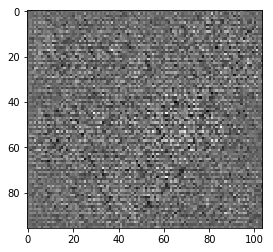

In [9]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)
generated_image = tf.keras.backend.eval(generated_image)
plt.imshow(generated_image[0, :, :, 0], cmap='gray')

## Descriminator Model

In [0]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[96, 103, 1]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

## Descriminator with no Training

In [11]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
decision = tf.keras.backend.eval(decision)
print (decision)

[[-0.0003221]]


## Defining Losses

In [0]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [0]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [0]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)



In [0]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

## How Long and How Many?

In [0]:
EPOCHS = 50
noise_dim = 100
num_examples_to_generate = 16

# We will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])
sess=tf.Session()

## Where the Magic Happens

In [0]:
@tf.function
def train_step(images):
#     noise = tf.random.normal([BATCH_SIZE, noise_dim])
    noise = tf.random.normal([1, 100])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)
      images = tf.expand_dims(images,0)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)
      # realout =tf.keras.backend.get_value(real_output)
      # print(realout)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

## Saves Checkpoints of the Model

In [0]:
def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

    # Produce images for the GIF as we go
#     display.clear_output(wait=True)
    generate_and_save_images(generator,
                             epoch + 1,
                             seed)

    # Save the model every 15 epochs
    if (epoch + 1) % 15 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  # Generate after the final epoch
#   display.clear_output(wait=True)
  generate_and_save_images(generator,
                           epochs,
                           seed)

## Generates Images

In [0]:
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(12,12))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      fingerout = tf.keras.backend.eval(predictions[i, :, :, 0] * 127.5 + 127.5)
      plt.imshow(fingerout, cmap='gray')
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

## Runs Everything

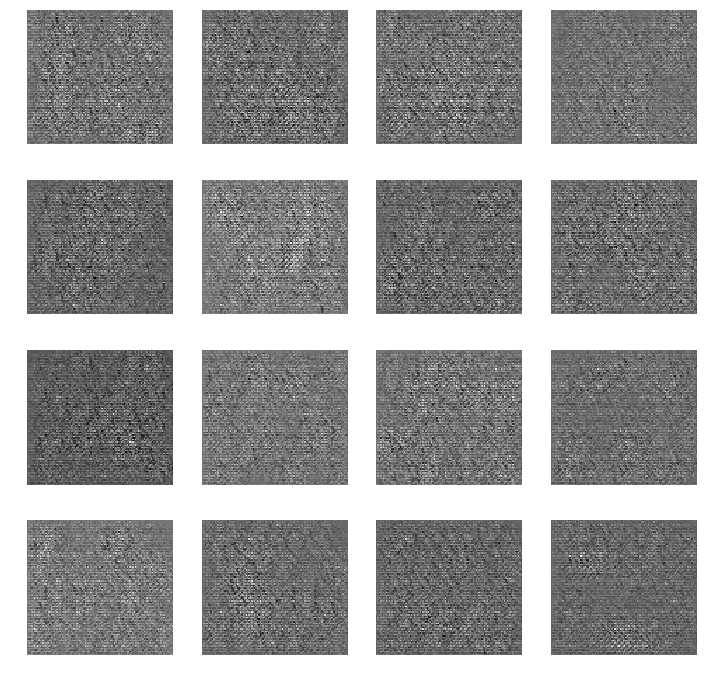

Time for epoch 1 is 344.14682698249817 sec


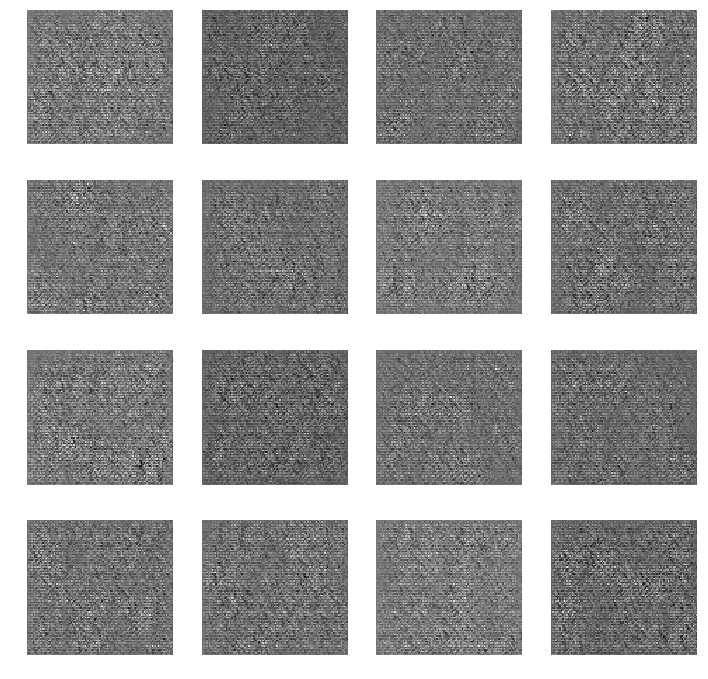

Time for epoch 2 is 379.85610032081604 sec


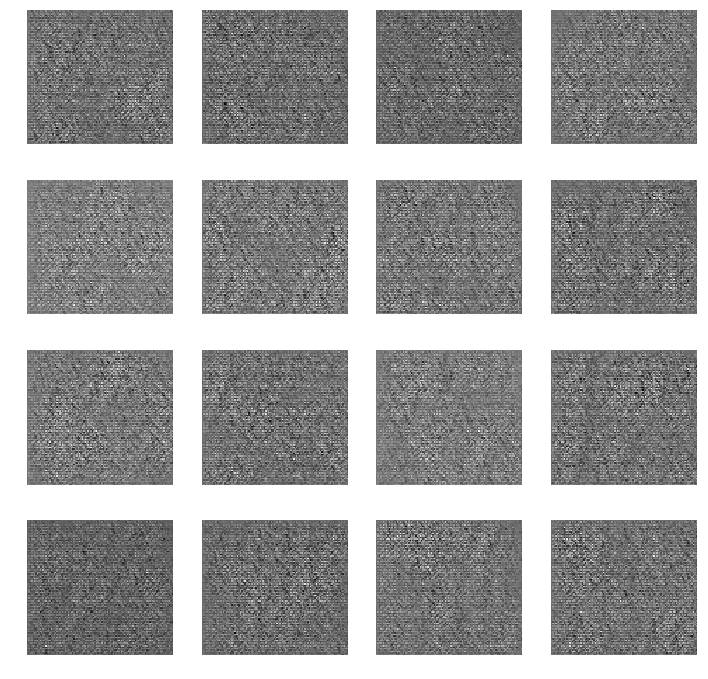

Time for epoch 3 is 405.42711782455444 sec


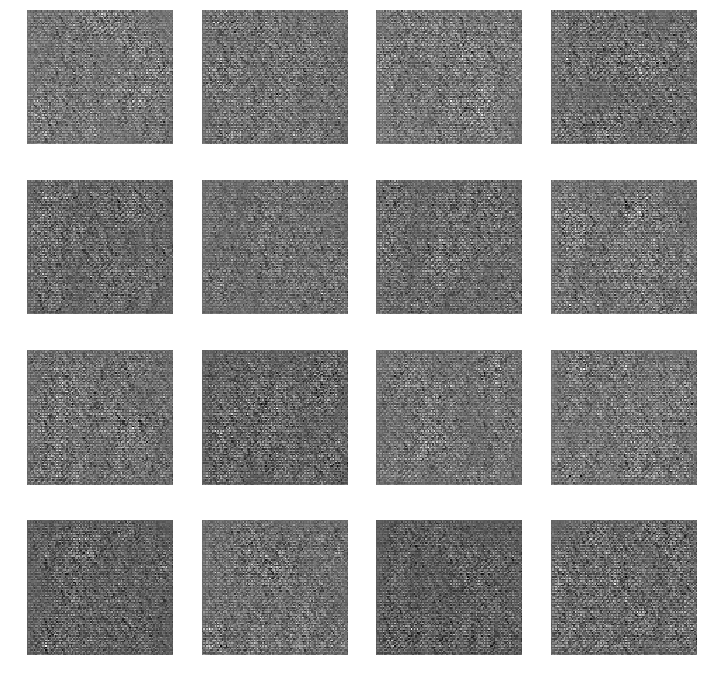

Time for epoch 4 is 442.85872197151184 sec


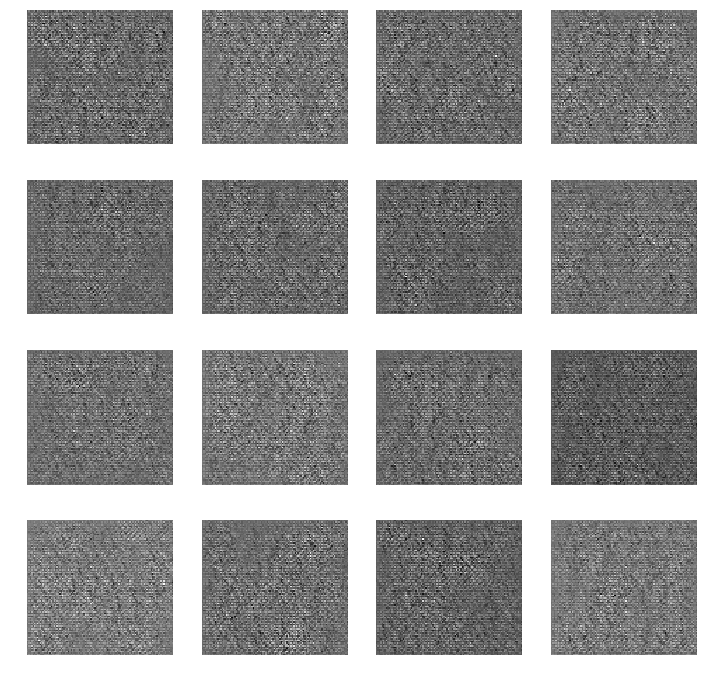

Time for epoch 5 is 469.73405051231384 sec


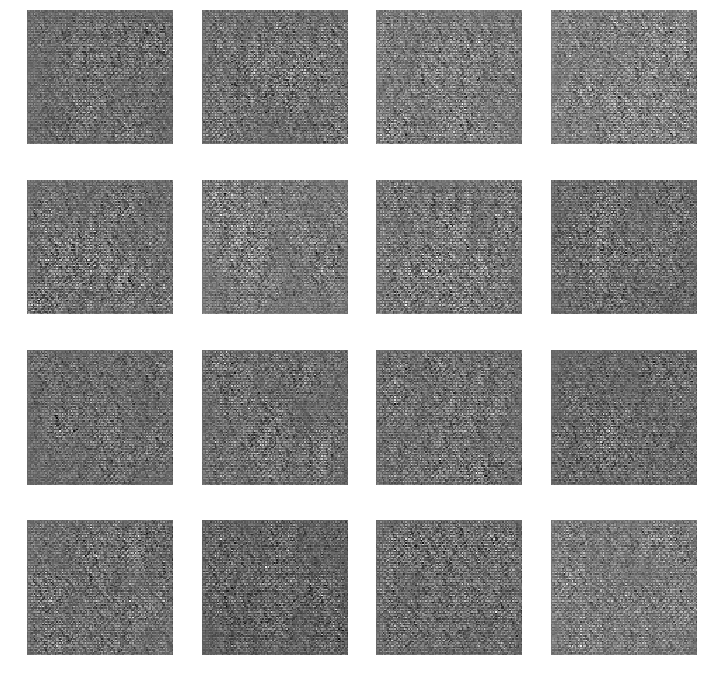

Time for epoch 6 is 516.2764863967896 sec


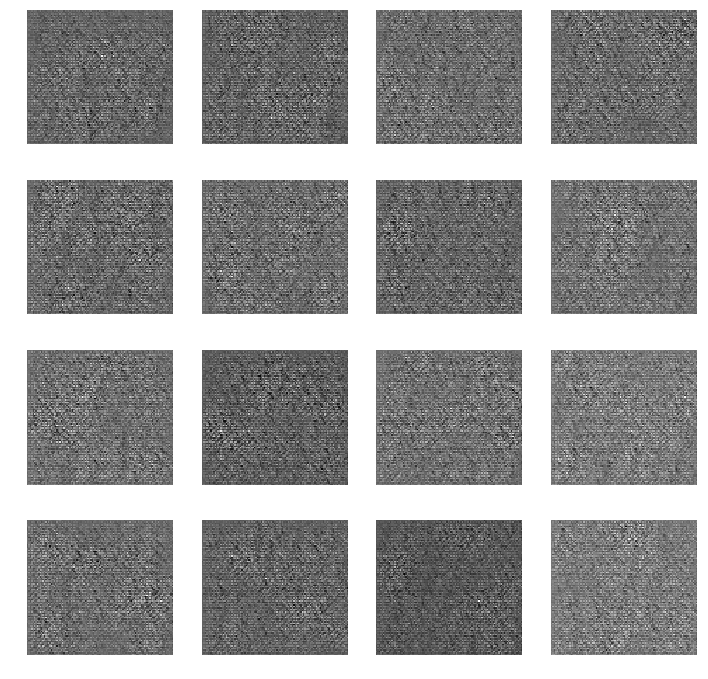

Time for epoch 7 is 577.9619174003601 sec


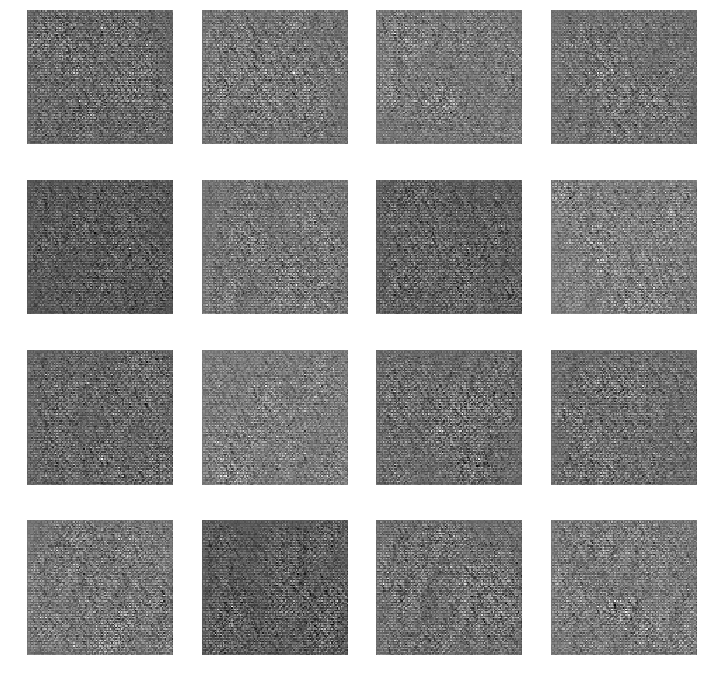

Time for epoch 8 is 614.6024198532104 sec


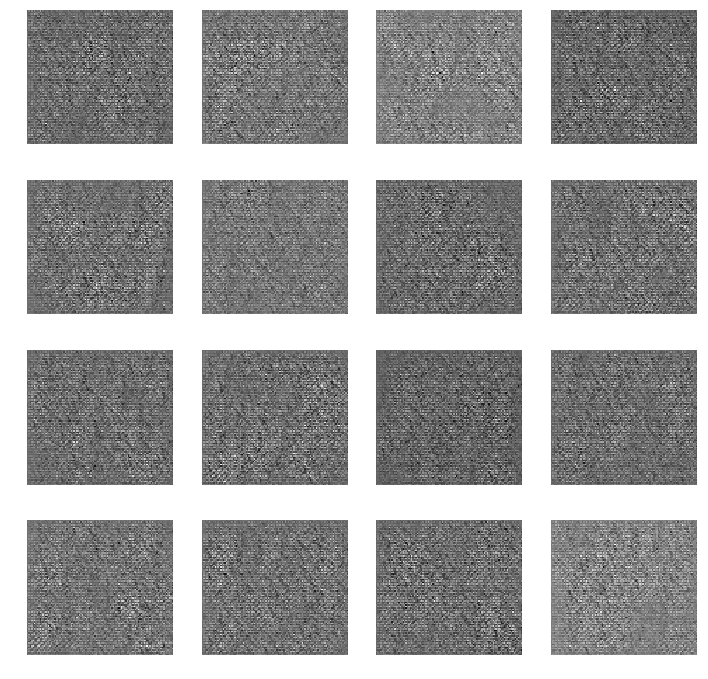

Time for epoch 9 is 648.6499879360199 sec


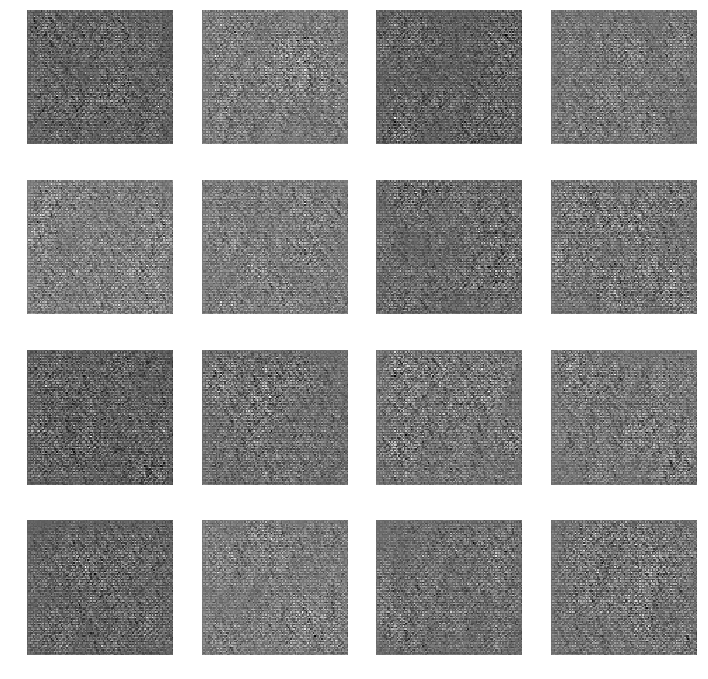

Time for epoch 10 is 668.7721402645111 sec


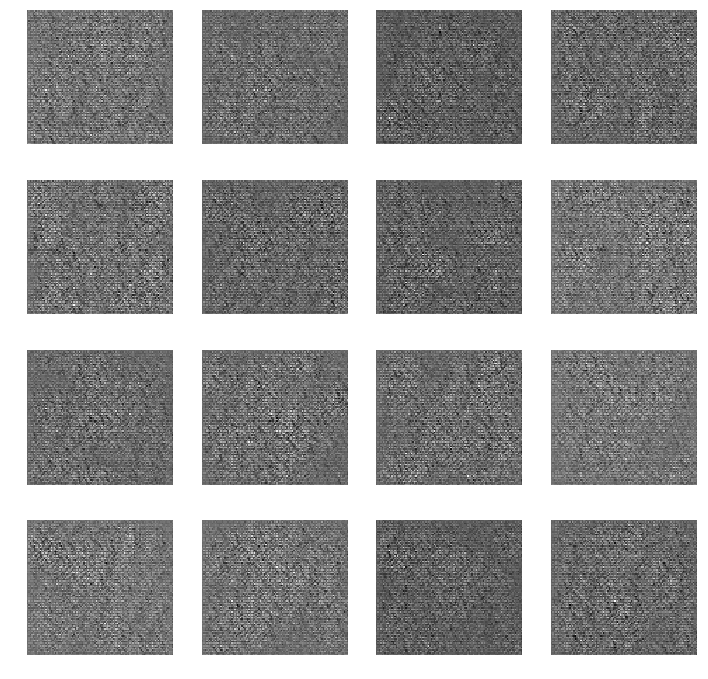

Time for epoch 11 is 719.2607254981995 sec


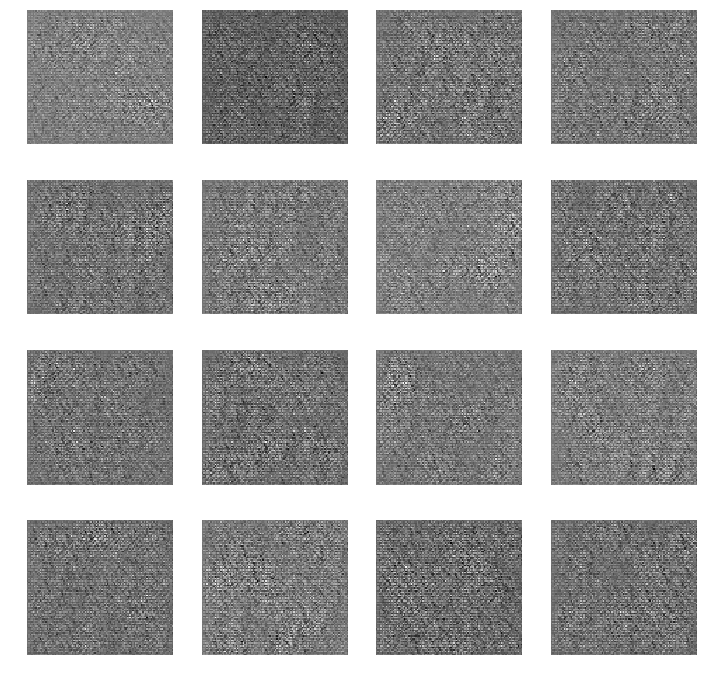

Time for epoch 12 is 739.2393851280212 sec


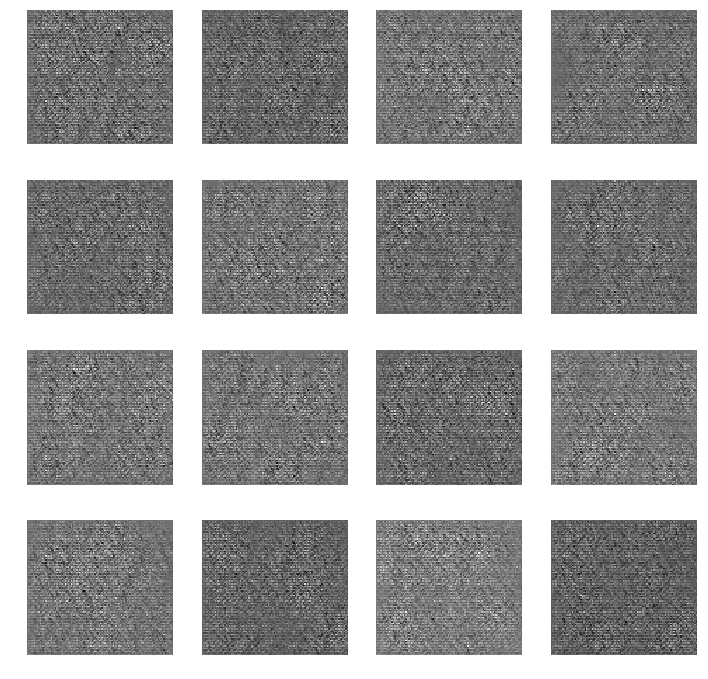

Time for epoch 13 is 802.3489093780518 sec


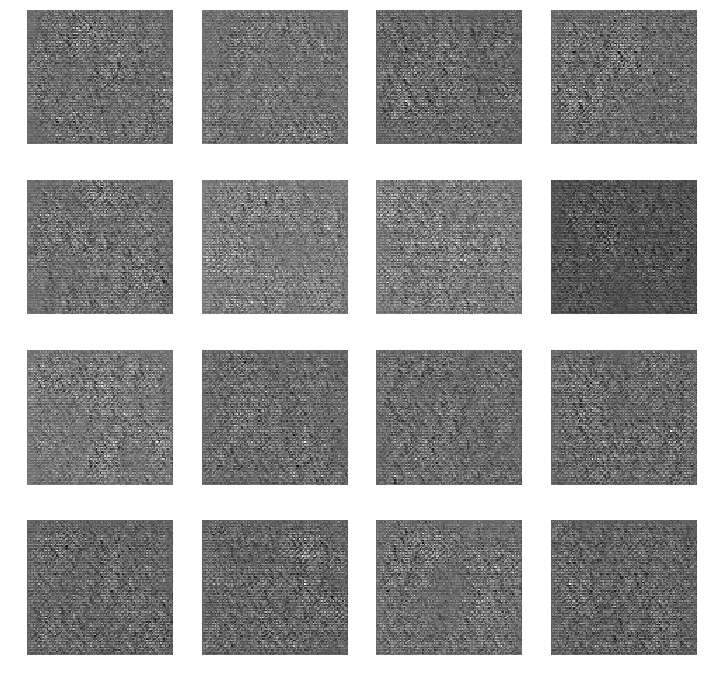

Time for epoch 14 is 837.7337720394135 sec


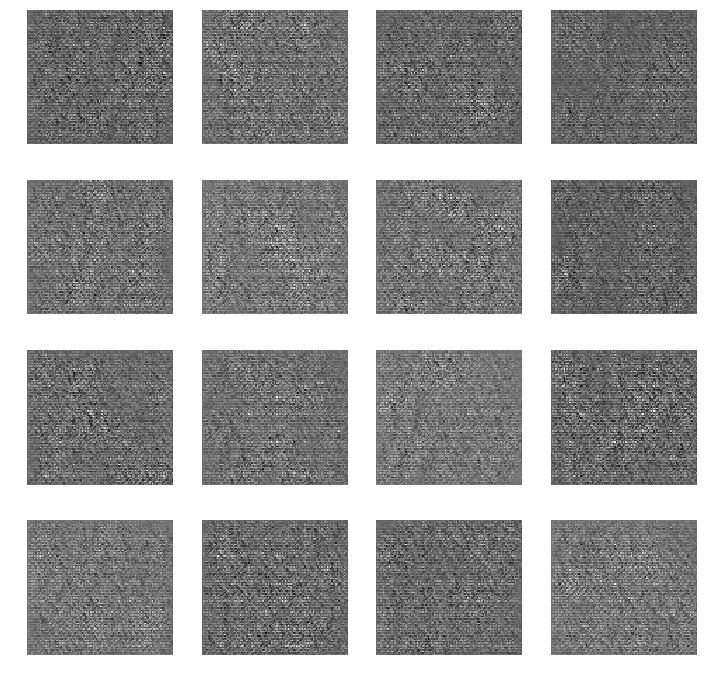

Time for epoch 15 is 1009.3938894271851 sec


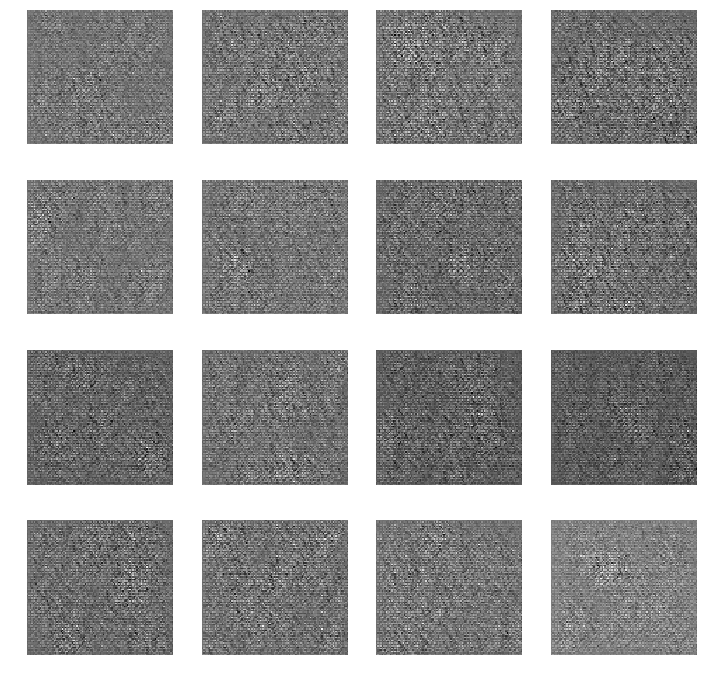

Time for epoch 16 is 905.5832669734955 sec


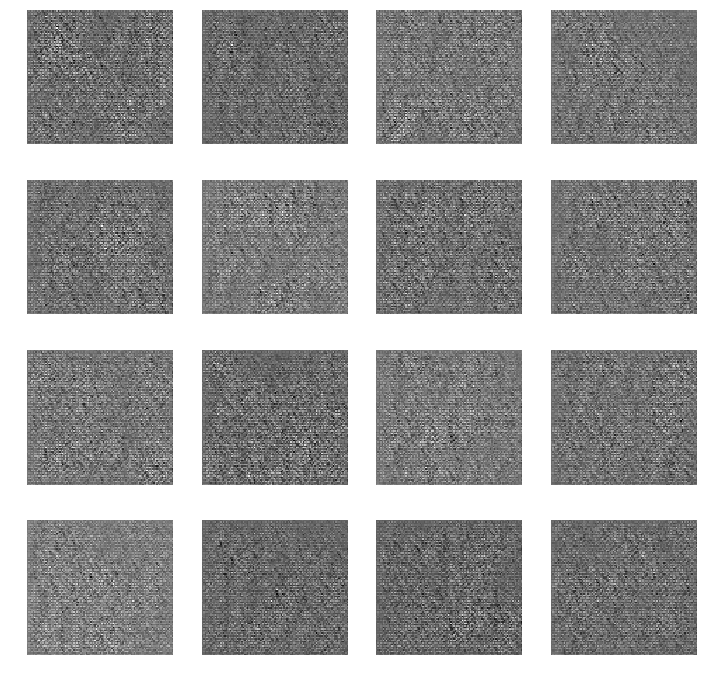

Time for epoch 17 is 973.4202167987823 sec


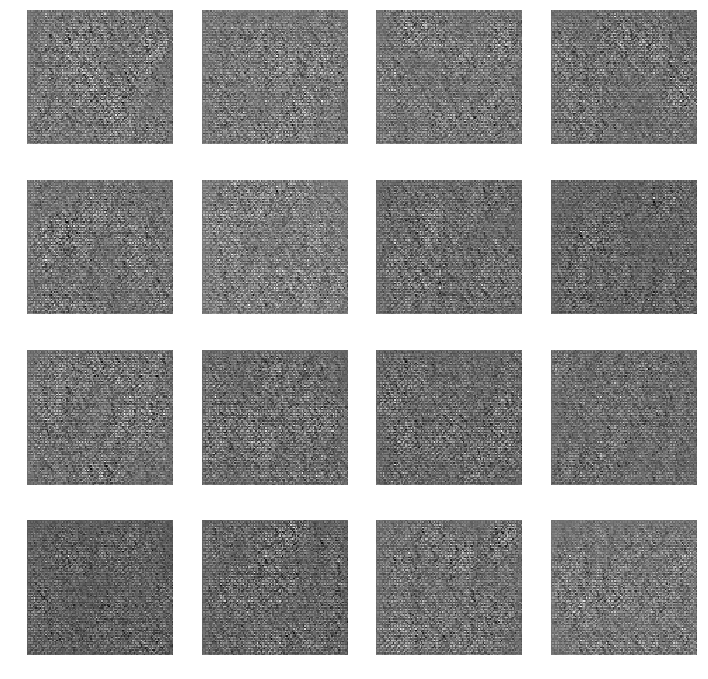

Time for epoch 18 is 1001.7777807712555 sec


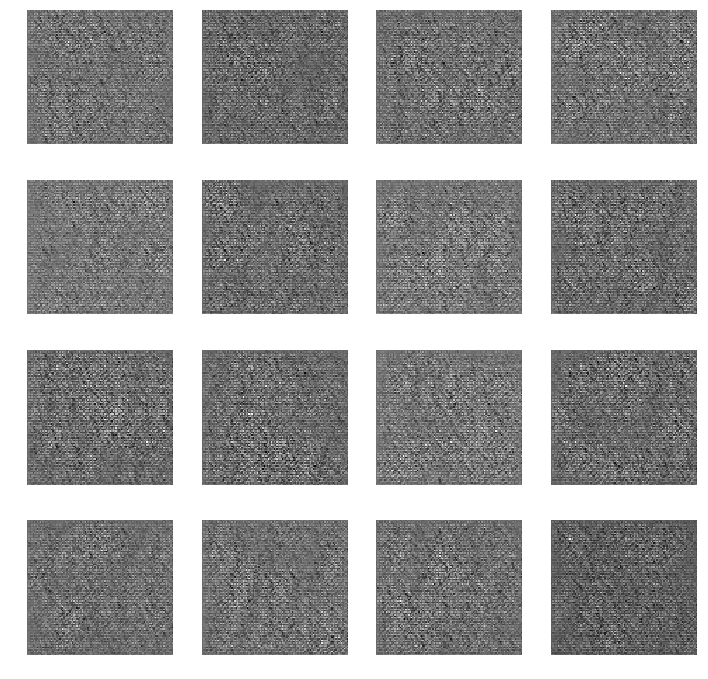

Time for epoch 19 is 1051.7845685482025 sec


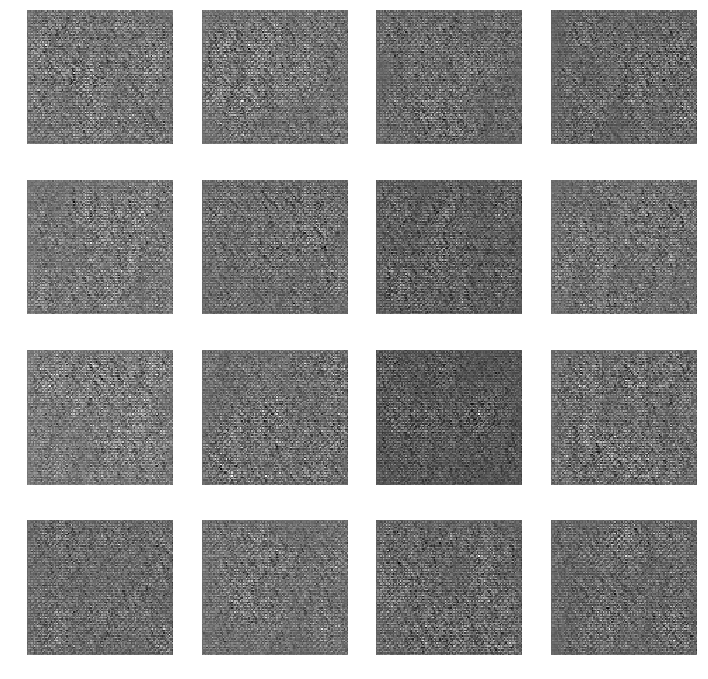

Time for epoch 20 is 1116.5249757766724 sec


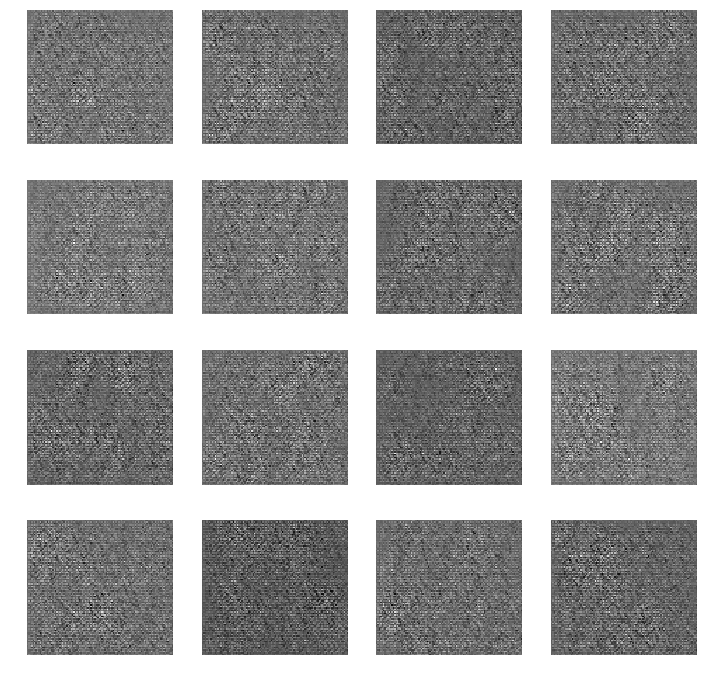

Time for epoch 21 is 1137.0697026252747 sec


In [0]:
%%time
# sess = tf.InteractiveSession()
train(train_X, EPOCHS)